# Mercari Price Suggestion Challenge
### Can you automatically suggest product prices to online sellers?

Authors:

- Gabriele Ferrario - 817518 - g.ferrario@campus.unimib.it

- Riccardo Pozzi - 807857 - r.pozzi@campus.unimib.it

The dataset consists of a list of products characterized by:
- train_id or test_id: the id of the listing
- name: the title of the listing.
- item_condition_id: the condition of the items provided by the seller
- category_name: category of the listing
- brand_name
- price: the price that the item was sold for. This is the target variable that you will predict. The unit is USD. This column doesn't exist in test.tsv since that is what you will predict.
- shipping: 1 if shipping fee is paid by seller and 0 by buyer
- item_description: the full description of the item.

# Setup

In [8]:
! pip install pydot graphviz emoji transformers

import pandas as pd
import numpy as np

import wordcloud

from nltk.tokenize import word_tokenize
import nltk
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

import tensorflow.keras.backend as K


from tqdm._tqdm_notebook import tqdm_notebook

import os
import itertools

import matplotlib.pyplot as plt
import itertools
from collections import Counter
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
import sklearn

from tensorflow.keras.layers import Dense, Input, Embedding, Concatenate, Flatten, Dropout, LSTM, GlobalMaxPool1D, Bidirectional
from tensorflow.keras.models import Model
from tensorflow.keras.utils import plot_model

from nltk.corpus import stopwords
import string

import pickle

from tensorflow.keras.preprocessing.text import text_to_word_sequence 
from nltk.stem import WordNetLemmatizer

from nltk.tokenize import TweetTokenizer

import emoji
import os

import transformers
from transformers import DistilBertTokenizerFast, TFDistilBertModel, pipeline

nltk.download('wordnet')
nltk.download('stopwords')
nltk.download('punkt')


stop_words = set(stopwords.words('english'))
stop_words.remove("no")

tqdm_notebook.pandas()

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [9]:
import matplotlib.pyplot as plt
plt.style.use('ggplot')

def plot_history(history):
    rmsle = history.history['root_mean_squared_logarithmic_error']
    val_rmsle = history.history['val_root_mean_squared_logarithmic_error']
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    x = range(1, len(rmsle) + 1)

    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(x, rmsle, 'b', label='Training rmsle')
    plt.plot(x, val_rmsle, 'r', label='Validation rmsle')
    plt.title('Training and validation root_mean_squared_logarithmic_error')
    plt.legend()
    plt.subplot(1, 2, 2)
    plt.plot(x, loss, 'b', label='Training loss')
    plt.plot(x, val_loss, 'r', label='Validation loss')
    plt.title('Training and validation loss')
    plt.legend()

Root Mean Squared Logarithmic Error (RMSLE)

In [10]:
msle = tf.keras.losses.MeanSquaredLogarithmicError()

def root_mean_squared_logarithmic_error(y_true, y_pred):
    return K.sqrt(msle(y_true, y_pred))

In [11]:
# seed
random_seed = 1000
np.random.seed(random_seed)
tf.random.set_seed(random_seed)

## Colab

In [12]:
RunningInCOLAB = 'google.colab' in str(get_ipython())

# check if in colab
if RunningInCOLAB and not os.path.isdir('/content/gdrive'):
    print("Running in colab")
    from google.colab import drive
    drive.mount('/content/gdrive', force_remount=True)
    colab_root = '/content/drive'
      
if RunningInCOLAB:
    root_dir = "/content/gdrive/My Drive/"
    base_dir = root_dir + 'project-mercari-price/'
    if not os.path.isdir(base_dir):
        os.mkdir(base_dir)
else:
    root_dir= os.getcwd()
    base_dir = root_dir

os.chdir(base_dir)

os.getcwd()

Running in colab
Mounted at /content/gdrive


'/content/gdrive/My Drive/project-mercari-price'

## Dataset download

In [ ]:
dataset_downloaded_path = os.path.join(base_dir, "dataset_downloaded.ignore")
dataset_downloaded = os.path.isfile(dataset_downloaded_path)
dataset_downloaded

if not dataset_downloaded:
  # install kaggle to download dataset
  ! pip install kaggle python-dotenv

# set to True if you want to save kaggle credentials into a .env file
persist_credentials = False

if not dataset_downloaded:
  # create .env file containing KAGGLE_USER and KAGGLE_KEY
    kaggle_env = os.path.join(base_dir, '.env')
    if not os.path.isfile(kaggle_env):
        with open(kaggle_env, 'w') as envfile:
            kaggle_user = input("Insert kaggle username")
            kaggle_key = input("Insert kaggle key; generate one from kaggle account")
        if persist_credentials:
            envfile.write(f"""
            KAGGLE_USERNAME={kaggle_user}
            KAGGLE_KEY={kaggle_key}
            """)

        # set env vars
        os.environ["KAGGLE_USERNAME"] = kaggle_user
        os.environ["KAGGLE_KEY"] = kaggle_key

        del kaggle_user
        del kaggle_key

if not dataset_downloaded:
  # loading env vars if .env file exists
    if os.path.isfile(kaggle_env):
        from dotenv import load_dotenv
        load_dotenv(dotenv_path=kaggle_env)
    print(os.environ.get("KAGGLE_USERNAME"))

if not dataset_downloaded:
    # download and extract dataset
    ! kaggle competitions download -c mercari-price-suggestion-challenge

    # create file so that we know we already downloaded
    with open(dataset_downloaded_path, 'w') as dd_file:
        dataset_downloaded = True
        dd_file.write("")

    print('cwd: ', os.getcwd())
    
    os.listdir()

if not dataset_downloaded:
    ! 7z x train.tsv.7z
    ! 7z x test.tsv.7z

os.listdir()

['train.tsv',
 'test.tsv',
 '.env',
 'sample_submission.csv.7z',
 'test_stg2.tsv.zip',
 'train.tsv.7z',
 'test.tsv.7z',
 'sample_submission_stg2.csv.zip',
 'dataset_downloaded',
 '.git',
 '.gitignore',
 'Notebook.Rmd',
 'Readme.md',
 'requirements.txt',
 'Untitled.ipynb',
 'git',
 'dataset_downloaded.ignore',
 'final_data.npy',
 'amazon_review_300d',
 'glove.6B.zip',
 'test_preprocess.npy',
 'train_preprocess.npy',
 'model.png']

# Dataset

In [21]:
dtypes={
    'name': 'string',
    'item_condition_id': 'int32',
    'category_name': 'string',
    'brand_name': 'string',
    'price': 'float',
    'shipping': 'int32',
    'item_description': 'string'
}
data = pd.read_csv("train.tsv", sep='\t', dtype=dtypes)
data = data.drop(columns=["train_id"])
print(data.dtypes)
print(data.shape)
data

name                  string
item_condition_id      int32
category_name         string
brand_name            string
price                float64
shipping               int32
item_description      string
dtype: object
(1482535, 7)


,name,item_condition_id,category_name,brand_name,price,shipping,item_description
0,MLB Cincinnati Reds T Shirt Size XL,3,Men/Tops/T-shirts,<NA>,10.0,1,No description yet
1,Razer BlackWidow Chroma Keyboard,3,Electronics/Computers & Tablets/Components & P...,Razer,52.0,0,This keyboard is in great condition and works ...
2,AVA-VIV Blouse,1,Women/Tops & Blouses/Blouse,Target,10.0,1,Adorable top with a hint of lace and a key hol...
3,Leather Horse Statues,1,Home/Home Décor/Home Décor Accents,<NA>,35.0,1,New with tags. Leather horses. Retail for [rm]...
4,24K GOLD plated rose,1,Women/Jewelry/Necklaces,<NA>,44.0,0,Complete with certificate of authenticity
...,...,...,...,...,...,...,...
1482530,Free People Inspired Dress,2,Women/Dresses/Mid-Calf,Free People,20.0,1,"Lace, says size small but fits medium perfectl..."
1482531,Little mermaid handmade dress,2,Kids/Girls 2T-5T/Dresses,Disney,14.0,0,Little mermaid handmade dress never worn size 2t
1482532,21 day fix containers and eating plan,2,Sports & Outdoors/Exercise/Fitness accessories,<NA>,12.0,0,"Used once or twice, still in great shape."
1482533,World markets lanterns,3,Home/Home Décor/Home Décor Accents,<NA>,45.0,1,There is 2 of each one that you see! So 2 red ...


## Dataset Analysis

### Check null values

In [ ]:
for column in data.columns:
    print("number of null value in {} : {}".format(column,data[column].isnull().sum()))

number of null value in name : 0
number of null value in item_condition_id : 0
number of null value in category_name : 6327
number of null value in brand_name : 632682
number of null value in price : 0
number of null value in shipping : 0
number of null value in item_description : 4


### Price

In [ ]:
data["price"].describe()

count    1.482535e+06
mean     2.673752e+01
std      3.858607e+01
min      0.000000e+00
25%      1.000000e+01
50%      1.700000e+01
75%      2.900000e+01
max      2.009000e+03
Name: price, dtype: float64

In [ ]:
import plotly.express as px
fig = px.histogram(data, x="price",)
fig.show()

### Shipping

In [ ]:
data["shipping"].value_counts()

0    819435
1    663100
Name: shipping, dtype: int64

In [ ]:
data["shipping"].value_counts()[0]/len(data["shipping"])*100

55.272556803043436

55% of the instances have a shipping value of 0, so 45% of the instances have a value of 1

Average price for each Shipping value


In [ ]:
data[data["shipping"]==0]["price"].mean()

30.111777627267568

In [ ]:
data[data["shipping"]==1]["price"].mean()

22.56772583320766

Distribution of prices in relation to shipping

In [ ]:
fig = px.histogram(data, x="price", color="shipping")
fig.show()

### Category Name

In [ ]:
data["category_name"].value_counts()

Women/Athletic Apparel/Pants, Tights, Leggings    60177
Women/Tops & Blouses/T-Shirts                     46380
Beauty/Makeup/Face                                34335
Beauty/Makeup/Lips                                29910
Electronics/Video Games & Consoles/Games          26557
                                                  ...  
Handmade/Woodworking/Accessories                      1
Handmade/Toys/Bear                                    1
Handmade/Patterns/Painting                            1
Handmade/Pets/Blanket                                 1
Vintage & Collectibles/Furniture/Storage              1
Name: category_name, Length: 1287, dtype: Int64

### Item Condition id

In [ ]:
data["item_condition_id"].value_counts()

1    640549
3    432161
2    375479
4     31962
5      2384
Name: item_condition_id, dtype: int64

Average prices for each item_condition_id

In [ ]:
data[data["item_condition_id"]==1]["price"].mean()

26.486966648921474

In [ ]:
data[data["item_condition_id"]==2]["price"].mean()

27.56322457447687

In [ ]:
data[data["item_condition_id"]==3]["price"].mean()

26.540710522235926

In [ ]:
data[data["item_condition_id"]==4]["price"].mean()

24.34921156373193

In [ ]:
data[data["item_condition_id"]==5]["price"].mean()

31.703859060402685

### Brand Name

In [ ]:
data["brand_name"].value_counts()

PINK                                 54088
Nike                                 54043
Victoria's Secret                    48036
LuLaRoe                              31024
Apple                                17322
                                     ...  
The Freshnes                             1
Stone Cold Fox                           1
Gottex                                   1
Walt Disney Studios Entertainment        1
Harold's                                 1
Name: brand_name, Length: 4809, dtype: Int64

### Item Description

In [ ]:
len(data[data["item_description"].str.lower() == "no description yet"])

79252

**Correlation between in price and length of descriptions**

In [ ]:
data["len_desc"]=data['item_description'].str.len()

In [ ]:
data[["price","len_desc"]].corr(method='pearson')

,price,len_desc
price,1.000000,0.048048
len_desc,0.048048,1.000000


fill na with "NA"

In [ ]:
data["item_description"] = data["item_description"].fillna(value="NA")
data["brand_name"] = data["brand_name"].fillna(value="NA")
data["category_name"] = data["category_name"].fillna(value="NA")
# see warnings -> inplace?
data.shape

(1482535, 7)

Descriptions Words Analysis by splitting the products into price ranges, with bigrams and WordCloud

In [ ]:
uno=data[data["price"]>=100]

In [ ]:
due=data[(data["price"]>50) & (data["price"]<100)]

In [ ]:
tre=data[(data["price"]>30) & (data["price"]<=50)]

In [ ]:
quattro=data[data["price"]<=30]

In [ ]:
def flat_list(l):
    return  [item for sublist in l for item in sublist]

In [ ]:
def word_Cloud(sentences):
    flat_sentences = flat_list(sentences)
    counter = Counter(flat_sentences)
    cdict = dict(counter.most_common())

    wcloud = wordcloud.WordCloud(background_color="white").generate_from_frequencies(cdict)
    plt.figure(figsize = (10, 8), facecolor = None) 
    plt.imshow(wcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: generator 'ngrams' raised StopIteration
  """Entry point for launching an IPython kernel.


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


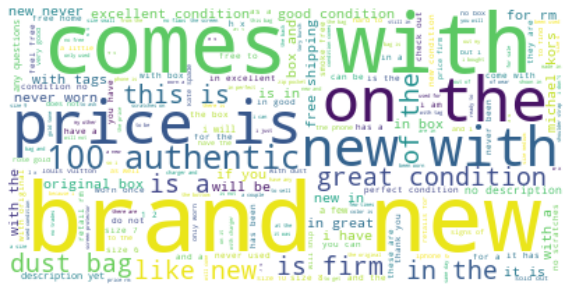

In [ ]:
uno["bigrams_description"]=(uno["item_description"].apply(text_to_word_sequence)).progress_apply(lambda row: list(nltk.ngrams(row, 2)))
uno["bigrams_description"]= uno["bigrams_description"].progress_apply(lambda tupla: [' '.join(elem) for elem in tupla])
word_Cloud(uno["bigrams_description"])

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: generator 'ngrams' raised StopIteration
  """Entry point for launching an IPython kernel.


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


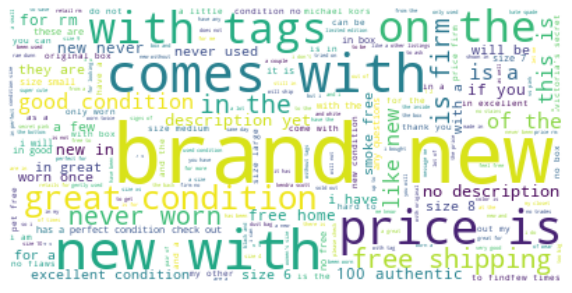

In [ ]:
due["bigrams_description"]=(due["item_description"].apply(text_to_word_sequence)).progress_apply(lambda row: list(nltk.ngrams(row, 2)))
due["bigrams_description"]= due["bigrams_description"].progress_apply(lambda tupla: [' '.join(elem) for elem in tupla])
word_Cloud(due["bigrams_description"])

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: generator 'ngrams' raised StopIteration
  """Entry point for launching an IPython kernel.


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


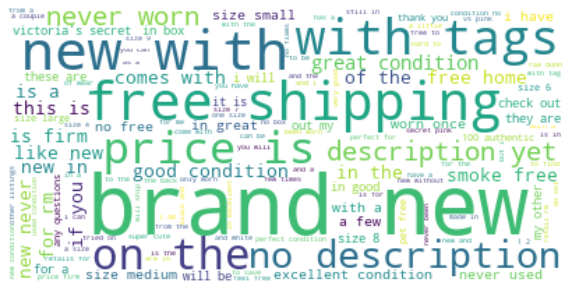

In [ ]:
tre["bigrams_description"]=(tre["item_description"].apply(text_to_word_sequence)).progress_apply(lambda row: list(nltk.ngrams(row, 2)))
tre["bigrams_description"]= tre["bigrams_description"].progress_apply(lambda tupla: [' '.join(elem) for elem in tupla])
word_Cloud(tre["bigrams_description"])

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: generator 'ngrams' raised StopIteration
  """Entry point for launching an IPython kernel.


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


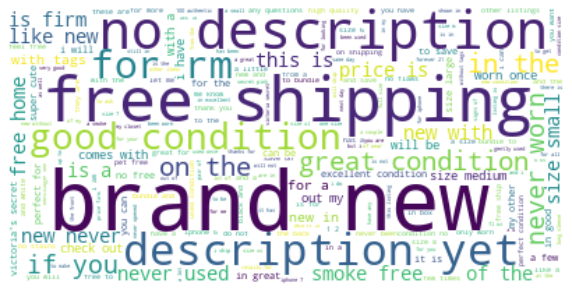

In [ ]:
quattro["bigrams_description"]=(quattro["item_description"].apply(text_to_word_sequence)).progress_apply(lambda row: list(nltk.ngrams(row, 2)))
quattro["bigrams_description"]= quattro["bigrams_description"].progress_apply(lambda tupla: [' '.join(elem) for elem in tupla])
word_Cloud(quattro["bigrams_description"])

# Data pre-processing

## Data cleaning

Handle wrong prices.

Prices should be in the range [5,2000]

https://www.mercari.com/us/help_center/article/69

In [22]:
data["item_description"] = data["item_description"].fillna(value="NA")
data["brand_name"] = data["brand_name"].fillna(value="NA")
data["category_name"] = data["category_name"].fillna(value="NA")
data.shape

(1482535, 7)

In [ ]:
len(data[(data["price"]<5) | (data["price"]>2000)])

35719

In [ ]:
data=data[(data["price"]>=5) & (data["price"]<=2000)]

In [ ]:
data.head()

,name,item_condition_id,category_name,brand_name,price,shipping,item_description
0,MLB Cincinnati Reds T Shirt Size XL,3,Men/Tops/T-shirts,NA,10.0,1,No description yet
1,Razer BlackWidow Chroma Keyboard,3,Electronics/Computers & Tablets/Components & P...,Razer,52.0,0,This keyboard is in great condition and works ...
2,AVA-VIV Blouse,1,Women/Tops & Blouses/Blouse,Target,10.0,1,Adorable top with a hint of lace and a key hol...
3,Leather Horse Statues,1,Home/Home Décor/Home Décor Accents,NA,35.0,1,New with tags. Leather horses. Retail for [rm]...
4,24K GOLD plated rose,1,Women/Jewelry/Necklaces,NA,44.0,0,Complete with certificate of authenticity


Converts all characters in the text data to lower case

In [ ]:
data["item_description"]=data["item_description"].str.lower()
data["name"]=data["name"].str.lower()
data.head()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,name,item_condition_id,category_name,brand_name,price,shipping,item_description
0,mlb cincinnati reds t shirt size xl,3,Men/Tops/T-shirts,NA,10.0,1,no description yet
1,razer blackwidow chroma keyboard,3,Electronics/Computers & Tablets/Components & P...,Razer,52.0,0,this keyboard is in great condition and works ...
2,ava-viv blouse,1,Women/Tops & Blouses/Blouse,Target,10.0,1,adorable top with a hint of lace and a key hol...
3,leather horse statues,1,Home/Home Décor/Home Décor Accents,NA,35.0,1,new with tags. leather horses. retail for [rm]...
4,24k gold plated rose,1,Women/Jewelry/Necklaces,NA,44.0,0,complete with certificate of authenticity


Replace description with "no description yet" with "NA"

In [ ]:
data["item_description"]=data["item_description"].replace("no description yet", "NA")

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


## Text cleanup
Steps:
- tokenization
- lemmatization
- removal of: punctuation, stop words, characters of length 1 that are not digits and emoji

In [ ]:
tweetTokenizer = TweetTokenizer()

def list_to_str(l):
   return ' '.join([str(elem) for elem in l])
   
def textCleanup(df, flag=True):
  df=df.to_frame(name="str")
  #df["clean"] = df["str"].progress_apply(text_to_word_sequence)   # 20 secondi
  global tweetTokenizer
  df["clean"] = df["str"].progress_apply(tweetTokenizer.tokenize) # 2 minutes but correctly handles emojis

  # punct and stop words
  

  lemmatizer = WordNetLemmatizer() 
  
  df["clean"] = df["clean"].progress_apply(lambda sentence : [lemmatizer.lemmatize(word) for word in sentence]) # 10 secondi
  df["clean"] = df["clean"].progress_apply(lambda sentence:
                                           [w for w in sentence if w
                                              not in string.punctuation
                                              and w not in stop_words and (len(w)>1 or w.isdigit()) and w not in emoji.UNICODE_EMOJI]) # 18 s
  plot_common_tokens(df["clean"], "Most Common Tokens without StopWords", n=20)
  if flag:
    df["clean"] = df["clean"].progress_apply(list_to_str) # 6 secondi
  return df["clean"]

In [ ]:
def preprocessData(data):
  print('description clean up')
  data["item_description_clean"] = textCleanup(data["item_description"]) 

  print('name clean up')
  data["name_clean"] = textCleanup(data["name"])
  
  return data

In [ ]:
def flat_list(l):
    return  [item for sublist in l for item in sublist]

In [ ]:
def plot_common_tokens(tokens, title, n=20):
    sentences = (list(itertools.chain(tokens)))
    flat_sentences = flat_list(sentences)
    counts = Counter(flat_sentences)
    #print(counts.most_common(30))
    common_words = [word[0] for word in counts.most_common(n)]
    common_counts = [word[1] for word in counts.most_common(n)]
    fig = plt.figure(figsize=(18,6))
    sns.barplot(x=common_words, y=common_counts)
    plt.title(title)
    plt.show()

description clean up


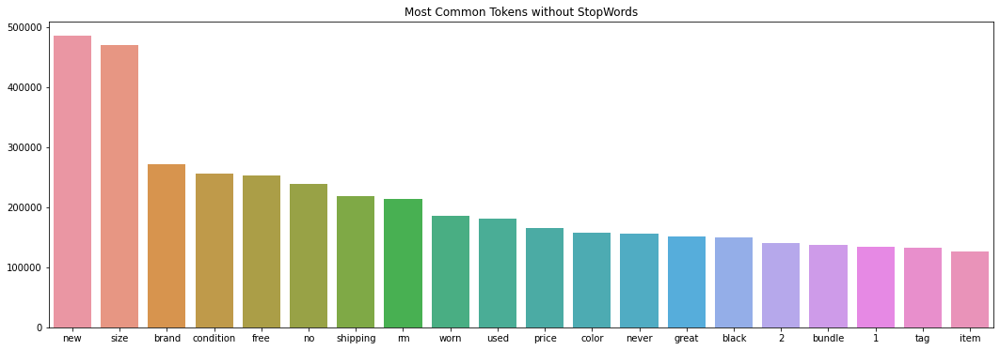


name clean up


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


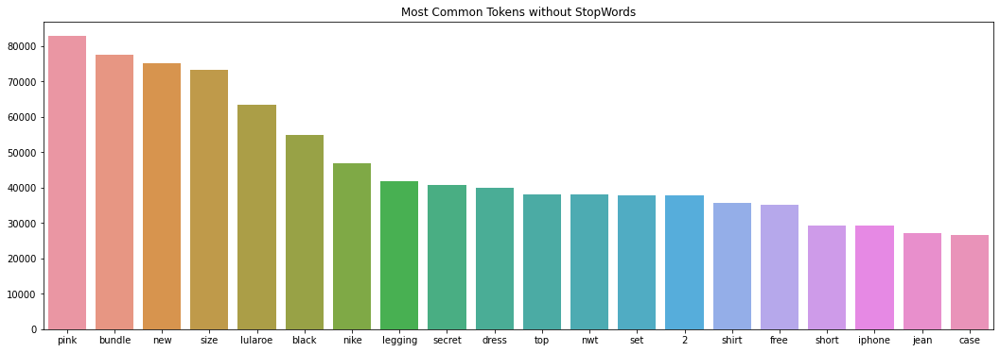

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,name,item_condition_id,category_name,brand_name,price,shipping,item_description,item_description_clean,name_clean
0,mlb cincinnati reds t shirt size xl,3,Men/Tops/T-shirts,NA,10.0,1,NA,NA,mlb cincinnati red shirt size xl
1,razer blackwidow chroma keyboard,3,Electronics/Computers & Tablets/Components & P...,Razer,52.0,0,this keyboard is in great condition and works ...,keyboard great condition work like came box po...,razer blackwidow chroma keyboard
2,ava-viv blouse,1,Women/Tops & Blouses/Blouse,Target,10.0,1,adorable top with a hint of lace and a key hol...,adorable top hint lace key hole back pale pink...,ava-viv blouse
3,leather horse statues,1,Home/Home Décor/Home Décor Accents,NA,35.0,1,new with tags. leather horses. retail for [rm]...,new tag leather horse retail rm stand foot hig...,leather horse statue
4,24k gold plated rose,1,Women/Jewelry/Necklaces,NA,44.0,0,complete with certificate of authenticity,complete certificate authenticity,24k gold plated rose


In [ ]:
data = preprocessData(data)
data.head()

## Categories split

Most category_name (~99.7%) contains 3 subcategories or less.

We consider the first 3 subcategories

In [ ]:
data["category_name"].apply(lambda x: x.count('/')+1).value_counts().sort_index() / data.shape[0]

1    0.004215
3    0.992768
4    0.000917
5    0.002100
Name: category_name, dtype: float64

In [18]:
def split_cat(text):
  """
  function to split category into 3 subcategories

  e.g:
  Men/Tops/T-shirts -> ["Men", "Tops", "T-shirts"]

  in case of more than 3 subcategories (~0.3% of the dataset)
  the last categories will be bounded toghether e.g.
  
  Men/Tops/T-shirts/RedTshirts/FlameTshirts ->
  -> ["Men", "Tops", "T-shirts/RedTshirts/FlameTshirts"]

  in case of less than 3 if fills with 'NA'
  """
  r = text.split("/", 2)
  while len(r) < 3:
    r = r + ['NA']
  return r

In [31]:
data['cat1'], data['cat2'], data['cat3'] = zip(*data['category_name'].progress_apply(lambda x: split_cat(x)))
data.head()

,name,item_condition_id,category_name,brand_name,price,shipping,item_description,cat1,cat2,cat3
0,MLB Cincinnati Reds T Shirt Size XL,3,Men/Tops/T-shirts,NA,10.0,1,No description yet,Men,Tops,T-shirts
1,Razer BlackWidow Chroma Keyboard,3,Electronics/Computers & Tablets/Components & P...,Razer,52.0,0,This keyboard is in great condition and works ...,Electronics,Computers & Tablets,Components & Parts
2,AVA-VIV Blouse,1,Women/Tops & Blouses/Blouse,Target,10.0,1,Adorable top with a hint of lace and a key hol...,Women,Tops & Blouses,Blouse
3,Leather Horse Statues,1,Home/Home Décor/Home Décor Accents,NA,35.0,1,New with tags. Leather horses. Retail for [rm]...,Home,Home Décor,Home Décor Accents
4,24K GOLD plated rose,1,Women/Jewelry/Necklaces,NA,44.0,0,Complete with certificate of authenticity,Women,Jewelry,Necklaces


## Train - Validation - Test split

In [26]:
# flag for using or not using text cleaning
use_clean = True

In [ ]:
if use_clean:
  print('Using cleaned name and description')
  data["item_description"] = data["item_description_clean"]
  data["name"] = data["name_clean"]
  data = data.drop(columns=["name_clean", "item_description_clean"])

In [ ]:
data.head(2)

,name,item_condition_id,category_name,brand_name,price,shipping,item_description,cat1,cat2,cat3
0,mlb cincinnati red shirt size xl,3,Men/Tops/T-shirts,NA,10.0,1,NA,Men,Tops,T-shirts
1,razer blackwidow chroma keyboard,3,Electronics/Computers & Tablets/Components & P...,Razer,52.0,0,keyboard great condition work like came box po...,Electronics,Computers & Tablets,Components & Parts


In [32]:
train, test = train_test_split(data, test_size=0.2, random_state=random_seed)

In [33]:
train, validation = train_test_split(train, test_size=0.2, random_state=random_seed)

In [ ]:
print('Train',train.shape)
print('Validation',validation.shape)
print('Test',test.shape)

Train (925961, 10)
Validation (231491, 10)
Test (289364, 10)


## Categorical Encoding

In [23]:
class LabelEncoder:
  """
  Simple single dimension label encoder class able to handle
  unknown values 
  """
  def __init__(self, unknown = 0, invUnknown = 'unknown'):
    self.leDict = {}
    self.invDict = {}
    self.unknown = unknown
    self.invUnknown = invUnknown

  def fit(self, data):
    vci = pd.value_counts(data).index
    self.leDict = dict(zip(vci, range(1, len(vci)+1)))
    self.invDict = dict(zip(range(1, len(vci)+1), vci))

  def transform1(self, item):
    return self.leDict.get(item, self.unknown)

  def transform(self, data):
    return data.apply(lambda item: self.transform1(item))

  def inverse_transform1(self, item):
    return self.invDict.get(item, self.invUnknown)

  def inverse_transform(self, data):
    return data.apply(lambda item: self.inverse_transform1(item))

Encoding of Brand_name and Category fields

In [34]:
cat_le = LabelEncoder()
cat_le.fit(np.hstack([train["cat1"], train['cat2'], train['cat3']]))

In [ ]:
train["cat1_l"] = cat_le.transform(train["cat1"])
train["cat2_l"] = cat_le.transform(train["cat2"])
train["cat3_l"] = cat_le.transform(train["cat3"])

In [35]:
brand_le = LabelEncoder()
brand_le.fit(train["brand_name"])

In [ ]:
train["brand_name_l"] = brand_le.transform(train["brand_name"])

In [ ]:
validation["cat1_l"] = cat_le.transform(validation["cat1"])
validation["cat2_l"] = cat_le.transform(validation["cat2"])
validation["cat3_l"] = cat_le.transform(validation["cat3"])

validation["brand_name_l"] = brand_le.transform(validation["brand_name"])

Test

In [ ]:
test["cat1_l"] = cat_le.transform(test["cat1"])
test["cat2_l"] = cat_le.transform(test["cat2"])
test["cat3_l"] = cat_le.transform(test["cat3"])

test["brand_name_l"] = brand_le.transform(test["brand_name"])



# Non-Textual Features



In [ ]:
train_cat = train
validation_cat = validation

In [ ]:
inputA_train_cat = train_cat[["item_condition_id", "cat1_l", "cat2_l", "cat3_l", "brand_name_l", "shipping"]].values.astype('int32')

In [ ]:
inputA_validation_cat = validation_cat[["item_condition_id", "cat1_l", "cat2_l", "cat3_l", "brand_name_l", "shipping"]].values.astype('int32')

In [ ]:
y_train_cat = train_cat["price"].values

In [ ]:
y_validation_cat = validation_cat["price"].values

In [ ]:
def getModelCat():
    inputA = Input(shape=(6,))

    x = Dense(32, activation='relu')(inputA)
    x = Dropout(0.2)(x)
    x = Dense(16, activation='relu')(x)
    x = Dropout(0.2)(x)
    
    x = Dense(1, activation='linear')(x)
    
    model = Model(inputs=inputA, outputs=x)
    
    return model

Definition of a model based only on the non-textual Featuress

In [ ]:
model_cat = getModelCat()
model_cat.summary()

Model: "model_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_6 (InputLayer)         [(None, 6)]               0         
_________________________________________________________________
dense_9 (Dense)              (None, 32)                224       
_________________________________________________________________
dropout_5 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_10 (Dense)             (None, 16)                528       
_________________________________________________________________
dropout_6 (Dropout)          (None, 16)                0         
_________________________________________________________________
dense_11 (Dense)             (None, 1)                 17        
Total params: 769
Trainable params: 769
Non-trainable params: 0
_____________________________________________________________

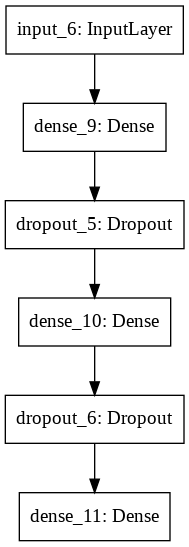

In [ ]:
plot_model(model_cat)

In [ ]:
model_cat.compile(
    loss = root_mean_squared_logarithmic_error,
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    metrics=['mse', 'mae', tf.keras.metrics.RootMeanSquaredError(), 'mean_squared_logarithmic_error', root_mean_squared_logarithmic_error])

In [ ]:
callback = [
             tf.keras.callbacks.EarlyStopping(
                  monitor='val_loss',
                  patience=3,
                  restore_best_weights=True
                  )
             ]

history_cat = model_cat.fit(x=inputA_train_cat, y=y_train_cat,
                    epochs=30,
                    verbose=True,
                    validation_data=(inputA_validation_cat, y_validation_cat),
                    callbacks=[callback],
                    batch_size=256)


Epoch 1/30
3618/3618 [==============================] - 14s 4ms/step - loss: 0.6977 - mse: 1531.5803 - mae: 15.8942 - root_mean_squared_error: 39.1354 - mean_squared_logarithmic_error: 0.4883 - root_mean_squared_logarithmic_error: 0.6976 - val_loss: 0.6786 - val_mse: 1583.7461 - val_mae: 15.6211 - val_root_mean_squared_error: 39.7963 - val_mean_squared_logarithmic_error: 0.4620 - val_root_mean_squared_logarithmic_error: 0.6787
Epoch 2/30
3618/3618 [==============================] - 13s 4ms/step - loss: 0.6956 - mse: 1529.3638 - mae: 15.8576 - root_mean_squared_error: 39.1071 - mean_squared_logarithmic_error: 0.4854 - root_mean_squared_logarithmic_error: 0.6955 - val_loss: 0.6766 - val_mse: 1577.9916 - val_mae: 15.6038 - val_root_mean_squared_error: 39.7239 - val_mean_squared_logarithmic_error: 0.4592 - val_root_mean_squared_logarithmic_error: 0.6767
Epoch 3/30
3618/3618 [==============================] - 14s 4ms/step - loss: 0.6941 - mse: 1527.4219 - mae: 15.8271 - root_mean_squared_er

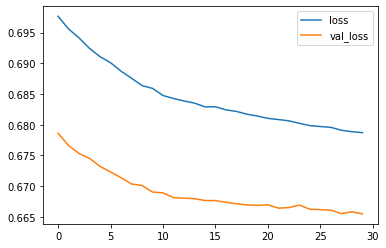

In [ ]:
histDf_cat = pd.DataFrame(history_cat.history)
histDf_cat.tail()
histDf_cat.plot(y=["loss",'val_loss'])

Test

In [ ]:
inputA_test_cat = test[["item_condition_id", "cat1_l", "cat2_l", "cat3_l", "brand_name_l", "shipping"]].values.astype('int32')

In [ ]:
y_test_cat = test["price"].values

In [ ]:
evaluation_cat = model_cat.evaluate(inputA_test_cat, y_test_cat, return_dict=True)
evaluation_cat

9043/9043 [==============================] - 23s 2ms/step - loss: 0.6563 - mse: 1438.6268 - mae: 15.2511 - root_mean_squared_error: 37.9292 - mean_squared_logarithmic_error: 0.4420 - root_mean_squared_logarithmic_error: 0.6563


{'loss': 0.6563481092453003,
 'mae': 15.251143455505371,
 'mean_squared_logarithmic_error': 0.4420236647129059,
 'mse': 1438.6268310546875,
 'root_mean_squared_error': 37.92923355102539,
 'root_mean_squared_logarithmic_error': 0.6563467383384705}

# BoW 

In [ ]:
train_cvec = train
validation_cvec = validation
test_cvec = test

In [ ]:
categorical_train_cvec= train_cvec[["item_condition_id","shipping", "cat1_l", "cat2_l", "cat3_l", "brand_name_l"]]
print("Train:")
print(categorical_train_cvec.head())
print("\nValidation:")
categorical_validation_cvec= validation_cvec[["item_condition_id","shipping","cat1_l", "cat2_l", "cat3_l","brand_name_l"]]
print(categorical_validation_cvec.head())

Train:
         item_condition_id  shipping  cat1_l  cat2_l  cat3_l  brand_name_l
437703                   1         0       1       9      18             2
347121                   3         1       1      13      66            58
978682                   3         0       6      16      36             6
504218                   2         0       1      15      44           153
1356479                  1         1       3      49      15             1

Validation:
        item_condition_id  shipping  cat1_l  cat2_l  cat3_l  brand_name_l
26401                   1         0       1       5      29           522
621860                  2         1       1      23      78             7
101634                  2         0       3      59       5             3
1123                    1         1       2      35       1           260
778998                  4         0       8       8       8             1


In [ ]:
categorical_test_cvec= test_cvec[["item_condition_id","shipping","cat1_l", "cat2_l", "cat3_l","brand_name_l"]]

In [ ]:
y_train_cvec=train_cvec["price"].values
y_validation_cvec=validation_cvec["price"].values

In [ ]:
y_test_cvec = test_cvec["price"].values

In [ ]:
def getModel_bow(categorical_train, name_train, description_train):
    inputA = Input(categorical_train.shape[1])
    inputName = Input(name_train.shape[1])
    inputDesc = Input(description_train.shape[1])
    concat = Concatenate()([inputName, inputDesc, inputA])

    x = Dense(32, activation='relu')(concat)
    x = Dropout(0.2)(x)
    x = Dense(16, activation='relu')(x)
    x = Dropout(0.2)(x)

    x = Dense(1, activation='linear')(x)
    
    model = Model(inputs=[inputName ,inputDesc, inputA], outputs=x)

    return model

## Count Vectorizer

Transformation of features into bag of words

In [ ]:
vectorizer_desc = CountVectorizer()
vectorizer_desc.fit(train_cvec["item_description"].values)

CountVectorizer(analyzer='word', binary=False, decode_error='strict',
                dtype=<class 'numpy.int64'>, encoding='utf-8', input='content',
                lowercase=True, max_df=1.0, max_features=None, min_df=1,
                ngram_range=(1, 1), preprocessor=None, stop_words=None,
                strip_accents=None, token_pattern='(?u)\\b\\w\\w+\\b',
                tokenizer=None, vocabulary=None)

In [ ]:
len(vectorizer_desc.vocabulary_)

127175

In [ ]:
description_train_cvec = vectorizer_desc.transform(train_cvec["item_description"].values)

In [ ]:
description_validation_cvec = vectorizer_desc.transform(validation_cvec["item_description"].values)

In [ ]:
description_test_cvec = vectorizer_desc.transform(test_cvec["item_description"].values)

In [ ]:
vectorizer_name = CountVectorizer()
vectorizer_name.fit(train_cvec["name"].values)

CountVectorizer(analyzer='word', binary=False, decode_error='strict',
                dtype=<class 'numpy.int64'>, encoding='utf-8', input='content',
                lowercase=True, max_df=1.0, max_features=None, min_df=1,
                ngram_range=(1, 1), preprocessor=None, stop_words=None,
                strip_accents=None, token_pattern='(?u)\\b\\w\\w+\\b',
                tokenizer=None, vocabulary=None)

In [ ]:
len(vectorizer_name.vocabulary_)

81490

In [ ]:
name_train_cvec = vectorizer_name.transform(train_cvec["name"].values)
name_validation_cvec = vectorizer_name.transform(validation_cvec["name"].values)

In [ ]:
name_test_cvec = vectorizer_name.transform(test_cvec["name"].values)

Model definition

In [ ]:
model_cvec = getModel_bow(categorical_train_cvec, name_train_cvec, description_train_cvec)
model_cvec.summary()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_8 (InputLayer)            [(None, 81490)]      0                                            
__________________________________________________________________________________________________
input_9 (InputLayer)            [(None, 127175)]     0                                            
__________________________________________________________________________________________________
input_7 (InputLayer)            [(None, 6)]          0                                            
__________________________________________________________________________________________________
concatenate_2 (Concatenate)     (None, 208671)       0           input_8[0][0]                    
                                                                 input_9[0][0]              

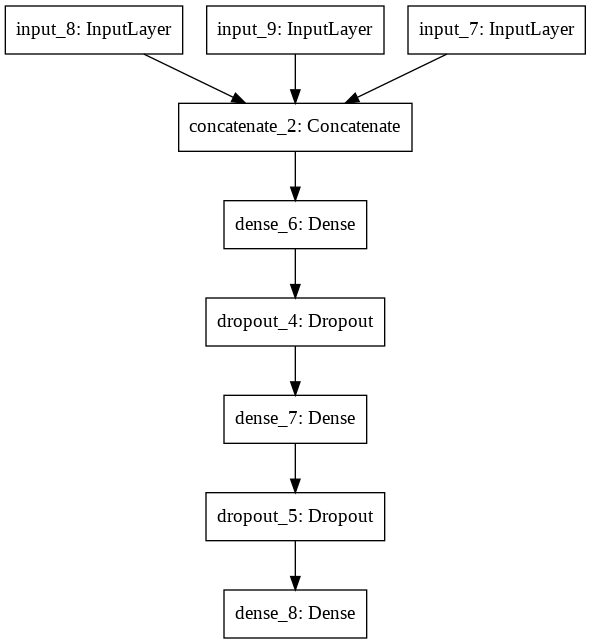

In [ ]:
plot_model(model_cvec)

In [ ]:
model_cvec.compile(loss = root_mean_squared_logarithmic_error, optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4), metrics=['mse', 'mae', tf.keras.metrics.RootMeanSquaredError(), 'mean_squared_logarithmic_error', root_mean_squared_logarithmic_error])

In [ ]:
callback = [
             tf.keras.callbacks.EarlyStopping(
                monitor='val_loss',
                  patience=3,
                  restore_best_weights=True
                  )
             ]

Model Fit

In [ ]:
history_cvec = model_cvec.fit(
    x=[
       name_train_cvec,
       description_train_cvec,
       categorical_train_cvec.values],
                    y=y_train_cvec,
                    epochs=20,
                    verbose=True,
                    validation_data=(
                        [name_validation_cvec, description_validation_cvec, categorical_validation_cvec.values],
                         y_validation_cvec),
                    callbacks=[callback],
                    batch_size=256)

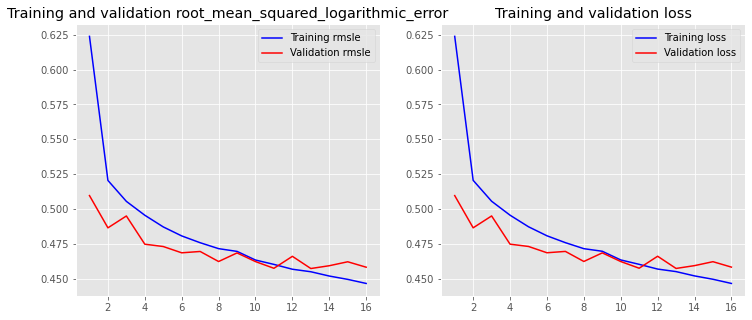

In [ ]:
plot_history(history_cvec)

In [ ]:
evaluation_cvec = model_cvec.evaluate(
    [name_test_cvec, description_test_cvec, categorical_test_cvec.values],
    y_test_cvec,
    return_dict=True)
evaluation_cvec

9043/9043 [==============================] - 65s 7ms/step - loss: 0.4492 - mse: 811.4613 - mae: 10.5615 - root_mean_squared_error: 28.4862 - mean_squared_logarithmic_error: 0.2082 - root_mean_squared_logarithmic_error: 0.4492


{'loss': 0.44923922419548035,
 'mae': 10.561534881591797,
 'mean_squared_logarithmic_error': 0.20820610225200653,
 'mse': 811.4613037109375,
 'root_mean_squared_error': 28.486160278320312,
 'root_mean_squared_logarithmic_error': 0.44923487305641174}

## TF-IDF

In [ ]:
tfidf_vectorizer_desc = TfidfVectorizer()
tfidf_vectorizer_desc.fit(train_cvec["item_description"].values)

TfidfVectorizer(analyzer='word', binary=False, decode_error='strict',
                dtype=<class 'numpy.float64'>, encoding='utf-8',
                input='content', lowercase=True, max_df=1.0, max_features=None,
                min_df=1, ngram_range=(1, 1), norm='l2', preprocessor=None,
                smooth_idf=True, stop_words=None, strip_accents=None,
                sublinear_tf=False, token_pattern='(?u)\\b\\w\\w+\\b',
                tokenizer=None, use_idf=True, vocabulary=None)

In [ ]:
len(tfidf_vectorizer_desc.vocabulary_)

127175

In [ ]:
tfidf_description_train = tfidf_vectorizer_desc.transform(train_cvec["item_description"].values)
tfidf_description_validation = tfidf_vectorizer_desc.transform(validation_cvec["item_description"].values)
tfidf_description_test = tfidf_vectorizer_desc.transform(test_cvec["item_description"].values)

In [ ]:
tfidf_vectorizer_name = TfidfVectorizer()
tfidf_vectorizer_name.fit(train_cvec["name"])

TfidfVectorizer(analyzer='word', binary=False, decode_error='strict',
                dtype=<class 'numpy.float64'>, encoding='utf-8',
                input='content', lowercase=True, max_df=1.0, max_features=None,
                min_df=1, ngram_range=(1, 1), norm='l2', preprocessor=None,
                smooth_idf=True, stop_words=None, strip_accents=None,
                sublinear_tf=False, token_pattern='(?u)\\b\\w\\w+\\b',
                tokenizer=None, use_idf=True, vocabulary=None)

In [ ]:
len(tfidf_vectorizer_name.vocabulary_)

81490

In [ ]:
tfidf_name_train = tfidf_vectorizer_name.transform(train_cvec["name"])
tfidf_name_validation = tfidf_vectorizer_name.transform(validation_cvec["name"])
tfidf_name_test = tfidf_vectorizer_name.transform(test_cvec["name"])

Conversion to sparse tensor 

In [ ]:
def convert_sparse_matrix_to_sparse_tensor(X):
    coo = X.tocoo()
    indices = np.mat([coo.row, coo.col]).transpose()
    return tf.SparseTensor(indices, coo.data, coo.shape)

In [ ]:
import scipy
new_categorical_train_cvec=scipy.sparse.csr_matrix(categorical_train_cvec.values)
new_categorical_validation_cvec=scipy.sparse.csr_matrix(categorical_validation_cvec.values)
new_categorical_test_cvec=scipy.sparse.csr_matrix(categorical_test_cvec.values)

In [ ]:
new_tfidf_name_validation=tf.sparse.reorder(convert_sparse_matrix_to_sparse_tensor(tfidf_name_validation))
new_tfidf_name_train=tf.sparse.reorder(convert_sparse_matrix_to_sparse_tensor(tfidf_name_train))
new_tfidf_name_test=tf.sparse.reorder(convert_sparse_matrix_to_sparse_tensor(tfidf_name_test))

In [ ]:
new_tfidf_description_validation=tf.sparse.reorder(convert_sparse_matrix_to_sparse_tensor(tfidf_description_validation))
new_tfidf_description_train=tf.sparse.reorder(convert_sparse_matrix_to_sparse_tensor(tfidf_description_train))
new_tfidf_description_test=tf.sparse.reorder(convert_sparse_matrix_to_sparse_tensor(tfidf_description_test))

In [ ]:
def getModel_bow(categorical_train, name_train, description_train):
    inputA = Input(categorical_train.shape[1])
    inputName = Input(name_train.shape[1])
    inputDesc = Input(description_train.shape[1])
    concat = Concatenate()([inputName, inputDesc, inputA])

    x = Dense(32, activation='relu')(concat)
    x = Dropout(0.2)(x)
    x = Dense(16, activation='relu')(x)
    x = Dropout(0.2)(x)

    x = Dense(1, activation='linear')(x)
    
    model = Model(inputs=[inputName, inputDesc, inputA], outputs=x)

    return model

Model Definition

In [ ]:
model = getModel_bow(categorical_train_cvec, new_tfidf_name_train, new_tfidf_description_train)
model.summary() 

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_8 (InputLayer)            [(None, 81490)]      0                                            
__________________________________________________________________________________________________
input_9 (InputLayer)            [(None, 127175)]     0                                            
__________________________________________________________________________________________________
input_7 (InputLayer)            [(None, 6)]          0                                            
__________________________________________________________________________________________________
concatenate_2 (Concatenate)     (None, 208671)       0           input_8[0][0]                    
                                                                 input_9[0][0]              

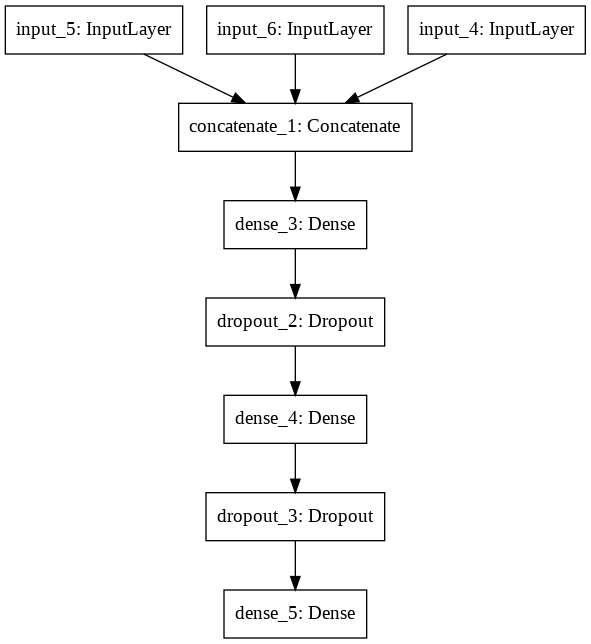

In [ ]:
plot_model(model)

In [ ]:
model.compile(
  loss = root_mean_squared_logarithmic_error,
  optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
  metrics=['mse', 'mae', tf.keras.metrics.RootMeanSquaredError(), 'mean_squared_logarithmic_error', root_mean_squared_logarithmic_error])

In [ ]:
callback = [
             tf.keras.callbacks.EarlyStopping(
                  monitor='val_loss',
                  patience=3,
                  restore_best_weights=True
                  )
             ]

Model Fit

In [ ]:
history = model.fit(x=[new_tfidf_name_train, new_tfidf_description_train, categorical_train_cvec.values], y=y_train_cvec,
                    epochs=20,
                    verbose=True,
                    validation_data=([new_tfidf_name_validation, new_tfidf_description_validation, categorical_validation_cvec.values], y_validation_cvec),
                    callbacks=[callback],
                    batch_size=256)

In [ ]:
plot_history(history)

Test

In [ ]:
evaluation_cvec = model.evaluate(
    [new_tfidf_name_test, new_tfidf_description_test, new_tfidf_categorical_test],
    y=y_test_cvec,
    return_dict=True)
evaluation_cvec

9043/9043 [==============================] - 31s 3ms/step - loss: 0.4540 - mse: 848.2068 - mae: 10.8633 - root_mean_squared_error: 29.1240 - mean_squared_logarithmic_error: 0.2122 - root_mean_squared_logarithmic_error: 0.4540


{'loss': 0.45401230454444885,
 'mae': 10.863340377807617,
 'mean_squared_logarithmic_error': 0.21224819123744965,
 'mse': 848.206787109375,
 'root_mean_squared_error': 29.12398910522461,
 'root_mean_squared_logarithmic_error': 0.4540041983127594}

# Words Embeddings

## Keras Embedding

In [ ]:
name_length_max=10
desc_length_max=75

In [ ]:
def tokenizeData(df, description, name, tokenizer= None, texts= None):
  if tokenizer == None:
    tokenizer = Tokenizer()

    print("fit tokenizer")
    tokenizer.fit_on_texts(texts)
  
  print('tokenize description')
  df["item_description_t"]=tokenizer.texts_to_sequences(df[description])

  print('tokenize name')
  df["name_t"]=tokenizer.texts_to_sequences(df[name])
  return df, tokenizer

Vectorize a text corpus, by turning each text into either a sequence of integers (each integer being the index of a token in a dictionary)

In [ ]:
texts = np.hstack([train["item_description"], train["name"]])

In [ ]:
train_keras, tokenizer = tokenizeData(
    train ,"item_description" ,"name", None, texts)

fit tokenizer
tokenize description
tokenize name


In [ ]:
validation_keras, _ = tokenizeData(
    validation ,"item_description" ,"name", tokenizer, None)

tokenize description
tokenize name


In [ ]:
vocab_size= len(tokenizer.word_index)+1
print(vocab_size)

198527


In [ ]:
train_keras[["item_description_t","name_t"]]

,item_description_t,name_t
437703,"[95, 102, 25, 3320, 1312, 234, 6, 177, 321, 62...","[177, 102, 25, 3320, 1312, 234]"
347121,"[71, 11, 21, 1113, 105, 765, 113, 99, 894, 58,...","[894, 1113, 11011, 907, 1491]"
978682,"[815, 1227, 39, 16]","[25, 102, 79, 45, 240, 88]"
504218,"[50, 30, 96, 340, 90, 78, 58, 3, 577, 1, 596, ...","[117, 1, 24, 2547, 78]"
1356479,"[161, 48, 1821, 2, 782, 10, 229, 200, 1, 132, ...","[95, 66, 6436, 21, 89, 193]"
...,...,...
1146930,"[2097, 254, 219, 39, 3, 29789, 4, 183, 2193, 8...","[2125, 46, 254, 1932, 17875]"
239823,"[94, 540, 42, 18, 194, 42, 2, 5, 2960, 1878, 1...","[3301, 723, 53, 540]"
1139517,"[1195, 6693, 970, 5671, 2166, 533, 32, 12, 20,...","[1195, 6693, 970, 5671, 2166, 533]"
169091,"[15, 5, 226, 11, 859, 320, 2174, 978]","[86, 11057, 597, 3077]"


In [ ]:
inputDesc_train_keras = pad_sequences(train_keras["item_description_t"],
                                                  padding='post', maxlen=desc_length_max)

In [ ]:
inputDesc_validation_keras = pad_sequences(validation_keras["item_description_t"],
                                                  padding='post', maxlen=desc_length_max)

In [ ]:
inputName_train_keras = pad_sequences(train_keras["name_t"], padding='post', maxlen=name_length_max)

In [ ]:
inputName_validation_keras = pad_sequences(validation_keras["name_t"], padding='post', maxlen=name_length_max)

In [ ]:
y_train_keras = train_keras["price"]
y_train_keras

437703     34.0
347121     50.0
978682      9.0
504218     18.0
1356479    30.0
           ... 
1146930     7.0
239823      7.0
1139517    12.0
169091     71.0
542186     23.0
Name: price, Length: 925961, dtype: float64

In [ ]:
y_validation_keras = validation_keras["price"]
y_validation_keras

26401       26.0
621860      15.0
101634      84.0
1123        12.0
778998       9.0
           ...  
1004746     31.0
696296      15.0
865104      90.0
642618     150.0
1473182     18.0
Name: price, Length: 231491, dtype: float64

In [ ]:
inputA_train_keras = train_keras[["item_condition_id", "cat1_l", "cat2_l", "cat3_l", "brand_name_l", "shipping"]].values.astype('int32')

In [ ]:
inputA_validation_keras = validation_keras[["item_condition_id", "cat1_l", "cat2_l", "cat3_l", "brand_name_l", "shipping"]].values.astype('int32')

In [ ]:
from keras.layers import Conv1D
from tensorflow.keras import regularizers

name_vocab_size= vocab_size
desc_vocab_size= vocab_size
def getModelKeras(inputA, name_length_max, desc_length_max, name_vocab_size, desc_vocab_size):
    inputA = Input(shape=(inputA.shape[1],))
    Ad = inputA
    
    inputName = Input(shape=(name_length_max,))
    Ne = Embedding(input_dim=name_vocab_size, output_dim=50, input_length=name_length_max)(inputName)
    # Nd = Conv1D(30, (5), activation='relu',
    #             kernel_regularizer=regularizers.l2(1e-4),
    #             bias_regularizer=regularizers.l2(1e-4)
    #             )(Ne)
    Nd = Bidirectional(
        LSTM(12, return_sequences=True, dropout=0.2,
             #kernel_regularizer=regularizers.l2(1e-4),
             #bias_regularizer=regularizers.l2(1e-4)
             ))(Ne)
    Nd = GlobalMaxPool1D()(Nd)

    
    inputDesc = Input(shape=(desc_length_max,))
    De = Embedding(input_dim=desc_vocab_size, output_dim=50, input_length=desc_length_max)(inputDesc)

    # Dd = Conv1D(30, (5), activation='relu',
    #             kernel_regularizer=regularizers.l2(1e-4),
    #             bias_regularizer=regularizers.l2(1e-4)
    #          )(De)
    Dd = Bidirectional(
        LSTM(16, return_sequences=True, dropout=0.2,
             #kernel_regularizer=regularizers.l2(1e-4),
             #bias_regularizer=regularizers.l2(1e-4)
             ))(De)
    Dd = Bidirectional(
        LSTM(8, return_sequences=True, dropout=0.2,
             #kernel_regularizer=regularizers.l2(1e-4),
             #bias_regularizer=regularizers.l2(1e-4)
             ))(Dd)

    Dd =  GlobalMaxPool1D()(Dd)
    
    concat = Concatenate()([Ad, Nd, Dd])
   
    x = Dense(32, activation='relu',
              #kernel_regularizer=regularizers.l2(1e-4),
              #bias_regularizer=regularizers.l2(1e-4)
              )(concat)
    x = Dropout(0.2)(x)
    x = Dense(16, activation='relu',
              #kernel_regularizer=regularizers.l2(1e-4),
              #bias_regularizer=regularizers.l2(1e-4)
              )(x)
    x = Dropout(0.2)(x)
    
    x = Dense(1, activation='linear')(x)
    
    model = Model(inputs=[inputA, inputName, inputDesc], outputs=x)
    
    return model
    

In [ ]:
model_keras = getModelKeras(inputA_train_keras, name_length_max, desc_length_max, name_vocab_size, desc_vocab_size)
model_keras.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 75)]         0                                            
__________________________________________________________________________________________________
input_2 (InputLayer)            [(None, 10)]         0                                            
__________________________________________________________________________________________________
embedding_1 (Embedding)         (None, 75, 50)       9926350     input_3[0][0]                    
__________________________________________________________________________________________________
embedding (Embedding)           (None, 10, 50)       9926350     input_2[0][0]                    
______________________________________________________________________________________________

Model Definition

In [ ]:
plot_model(model_keras)

In [ ]:
model_keras.compile(
    loss = root_mean_squared_logarithmic_error,
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
    metrics=['mse', 'mae', tf.keras.metrics.RootMeanSquaredError(),
             'mean_squared_logarithmic_error', root_mean_squared_logarithmic_error])

In [ ]:
callback = [
             tf.keras.callbacks.EarlyStopping(
                  monitor='val_loss',
                  patience=3,
                  restore_best_weights=True
                  )
             ]

In [ ]:
history_keras = model_keras.fit(x=[inputA_train_keras,inputName_train_keras, inputDesc_train_keras], y=y_train_keras,
                    epochs=10,
                    verbose=True,
                    validation_data=([inputA_validation_keras, inputName_validation_keras, inputDesc_validation_keras], y_validation_keras),
                    callbacks=[callback],
                    batch_size=256)

Test

In [ ]:
test_keras, _ = tokenizeData(
    test ,"item_description" ,"name", tokenizer, None)

test_keras.head()

tokenize description


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.


tokenize name


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  del sys.path[0]


,name,item_condition_id,category_name,brand_name,price,shipping,item_description,cat1,cat2,cat3,cat1_l,cat2_l,cat3_l,brand_name_l,item_description_t,name_t
1378348,black & white chuck taylor converse low,3,Kids/Boys 2T-5T/Shoes,NA,17.0,0,in excellent used condition. they were hardly ...,Kids,Boys 2T-5T,Shoes,3,65,5,1,"[7, 137, 31, 16, 109, 556, 1214, 30, 83, 4, 44...","[24, 59, 4168, 1807, 641, 319]"
1186436,new christopher/banks mother pearl ring,1,Women/Jewelry/Rings,Christopher & Banks,9.0,0,women's sz 7 mother of pearl ring from christo...,Women,Jewelry,Rings,1,13,83,968,"[125, 220, 64, 2759, 11, 1018, 275, 43, 11455,...","[5, 11455, 9408, 2759, 1018, 275]"
1356069,"benefit precisely, my brow pencil #6",1,Beauty/Makeup/Eyes,Benefit,12.0,1,new shade #6 retails [rm],Beauty,Makeup,Eyes,2,7,33,64,"[5, 434, 45, 338, 22]","[1195, 7418, 33, 970, 951, 45]"
981119,jordan hydro 2 slide sandals,3,Kids/Girls 2T-5T/Shoes,NA,15.0,1,in good condition has a scrape on the side of ...,Kids,Girls 2T-5T,Shoes,3,49,5,1,"[7, 58, 16, 56, 4, 11364, 13, 2, 287, 11, 46, ...","[399, 5599, 21, 2381, 427]"
1017698,baby einstein crib fish soother,2,Kids/Toys/Baby & Toddler Toys,Baby Einstein,17.0,0,"great shape, fresh batteries! i swear by this!...",Kids,Toys,Baby & Toddler Toys,3,14,202,643,"[39, 383, 859, 1252, 14, 9490, 104, 29, 508, 1...","[160, 9498, 2634, 2416, 17216]"


In [ ]:
inputName_test_keras = pad_sequences(test_keras["name_t"], padding='post', maxlen=name_length_max)

In [ ]:
inputDesc_test_keras = pad_sequences(test_keras["item_description_t"],
                                                  padding='post', maxlen=desc_length_max)

In [ ]:
inputA_test_keras = test_keras[["item_condition_id", "cat1_l", "cat2_l", "cat3_l", "brand_name_l", "shipping"]].values.astype('int32')

In [ ]:
y_test_keras = test_keras["price"]
y_test_keras

1378348     17.0
1186436      9.0
1356069     12.0
981119      15.0
1017698     17.0
           ...  
1374848     20.0
1415233     10.0
376025      28.0
511335      19.0
233645     105.0
Name: price, Length: 289364, dtype: float64

In [ ]:
evaluation_keras = model_keras.evaluate(
    [inputA_test_keras, inputName_test_keras, inputDesc_test_keras],
    y_test_keras,
    return_dict=True)
evaluation_keras

9043/9043 [==============================] - 118s 13ms/step - loss: 0.4578 - mse: 855.2409 - mae: 10.8487 - root_mean_squared_error: 29.2445 - mean_squared_logarithmic_error: 0.2161 - root_mean_squared_logarithmic_error: 0.4578


{'loss': 0.4578080475330353,
 'mae': 10.848687171936035,
 'mean_squared_logarithmic_error': 0.2160569429397583,
 'mse': 855.2409057617188,
 'root_mean_squared_error': 29.244503021240234,
 'root_mean_squared_logarithmic_error': 0.4578019678592682}

In [ ]:
plot_history(history_keras)

## Glove pretrained

https://nlp.stanford.edu/projects/glove/

In [ ]:
#archive_url = 'http://downloads.cs.stanford.edu/nlp/data/wordvecs/glove.6B.zip'
archive_url = 'http://downloads.cs.stanford.edu/nlp/data/wordvecs/glove.840B.300d.zip'
archive_name = 'glove.840B.300d.zip'
remove_archive = False
embedding_fname = 'glove.840B.300d.txt'
embedding_dim = 300

In [ ]:
if not os.path.isfile(archive_name) and not os.path.isfile(embedding_fname):
  ! wget {archive_url} -O {archive_name}

In [ ]:
if not os.path.isfile(embedding_fname):
  ! unzip {archive_name} {embedding_fname}

# remove archive if already extracted
if remove_archive and os.path.isfile(embedding_fname):
  os.remove(archive_name)

In [ ]:
texts = np.hstack([train["item_description"], train["name"]])
tokenizer = Tokenizer()

print("fit tokenizer")
tokenizer.fit_on_texts(texts)

fit tokenizer


In [ ]:
word_index = tokenizer.word_index
print(len(word_index))

150998


In [ ]:
path_to_glove_file = os.path.join(
    base_dir, embedding_fname
)

'embeddings_index = {}\nwith open(path_to_glove_file) as f:\n    for line in f:\n        word, coefs = line.split(maxsplit=1)\n        coefs = np.fromstring(coefs, "f", sep=" ")\n        embeddings_index[word] = coefs\n\nprint("Found %s word vectors." % len(embeddings_index))'

In [ ]:
path_to_glove_file

'/content/gdrive/My Drive/project-mercari-price/glove.840B.300d.txt'

In [ ]:
def create_embedding_matrix(filepath, word_index, embedding_dim):
    vocab_size = len(word_index) + 1  # Adding again 1 because of reserved 0 index (padding)
    embedding_matrix = np.zeros((vocab_size, embedding_dim))

    with open(filepath) as f:
        for line in f:
            word, *vector = line.split()
            if word in word_index:
              i = word_index[word]
              try: 
                embedding_matrix[i] = np.array(vector, dtype=np.float32)[:embedding_dim]
                
  
              except:

                vector=vector[1:embedding_dim+1]
                embedding_matrix[i] = np.array(vector, dtype=np.float32)


    return embedding_matrix

Creates the embedding matrix considering only the words present in both the vocabulary defined on the dataset texts and the Glove vocabulary

In [ ]:
embedding_matrix = create_embedding_matrix(path_to_glove_file, tokenizer.word_index, embedding_dim)

In [ ]:
(embedding_matrix.size, embedding_matrix[0].size)

(45299700, 300)

In [ ]:
vocab_size = len(word_index) + 1
nonzero_elements = np.count_nonzero(np.count_nonzero(embedding_matrix, axis=1))
print('Copertura', nonzero_elements / vocab_size)

Copertura 0.5154537447267863


In [ ]:
name_length_max=10
desc_length_max=75

In [ ]:
def tokenizeData(df, description, name, tokenizer= None, texts= None):
  if tokenizer == None:
    tokenizer = Tokenizer()

    print("fit tokenizer")
    tokenizer.fit_on_texts(texts)
  
  print('tokenize description')
  df["item_description_t"]=tokenizer.texts_to_sequences(df[description])

  print('tokenize name')
  df["name_t"]=tokenizer.texts_to_sequences(df[name])
  return df, tokenizer

In [ ]:
train_glove, _ = tokenizeData(
    train ,"item_description" ,"name", tokenizer, None)

tokenize description
tokenize name


In [ ]:
validation_glove, _ = tokenizeData(
    validation ,"item_description" ,"name", tokenizer, None)

tokenize description
tokenize name


In [ ]:
vocab_size= len(tokenizer.word_index)+1
print(vocab_size)

150999


In [ ]:
inputDesc_train_glove = pad_sequences(train_glove["item_description_t"],
                                                  padding='post', maxlen=desc_length_max)

In [ ]:
inputDesc_validation_glove = pad_sequences(validation_glove["item_description_t"],
                                                  padding='post', maxlen=desc_length_max)

In [ ]:
inputName_train_glove = pad_sequences(train_glove["name_t"], padding='post', maxlen=name_length_max)

In [ ]:
inputName_validation_glove = pad_sequences(validation_glove["name_t"], padding='post', maxlen=name_length_max)

In [ ]:
y_train_glove = train_glove["price"]
y_train_glove

437703     34.0
347121     50.0
978682      9.0
504218     18.0
1356479    30.0
           ... 
1146930     7.0
239823      7.0
1139517    12.0
169091     71.0
542186     23.0
Name: price, Length: 925961, dtype: float64

In [ ]:
y_validation_glove = validation_glove["price"]
y_validation_glove

26401       26.0
621860      15.0
101634      84.0
1123        12.0
778998       9.0
           ...  
1004746     31.0
696296      15.0
865104      90.0
642618     150.0
1473182     18.0
Name: price, Length: 231491, dtype: float64

In [ ]:
inputA_train_glove = train_glove[["item_condition_id", "cat1_l", "cat2_l", "cat3_l", "brand_name_l", "shipping"]].values.astype('int32')

In [ ]:
inputA_validation_glove = validation_glove[["item_condition_id", "cat1_l", "cat2_l", "cat3_l", "brand_name_l", "shipping"]].values.astype('int32')

In [ ]:
def getModelGlove(name_length_max, desc_length_max, name_vocab_size, desc_vocab_size, embedding_matrix=None):
    inputA = Input(shape=(6,))
    Ad = inputA
    
    inputName = Input(shape=(name_length_max,))
    
    Ne = Embedding(input_dim=name_vocab_size, output_dim=embedding_matrix[0].size, weights=[embedding_matrix], input_length=name_length_max, trainable=False)(inputName)

    Nd = Bidirectional(LSTM(12, return_sequences=True, dropout=0.2))(Ne)
    Nd =  GlobalMaxPool1D()(Nd)
    
    inputDesc = Input(shape=(desc_length_max,))
    De = Embedding(input_dim=desc_vocab_size, output_dim=embedding_matrix[0].size, weights=[embedding_matrix], input_length=desc_length_max, trainable=False)(inputDesc)


    Dd = Bidirectional(LSTM(16, return_sequences=True, dropout=0.2))(De)
    Dd = Bidirectional(LSTM(8, return_sequences=True, dropout=0.2))(Dd)
    
    Dd =  GlobalMaxPool1D()(Dd)
    
    concat = Concatenate()([Ad, Nd, Dd])
    
    x = Dense(32, activation='relu')(concat)
    x = Dropout(0.2)(x)
    x = Dense(16, activation='relu')(x)
    x = Dropout(0.2)(x)
    
    x = Dense(1, activation='linear')(x)
    
    model = Model(inputs=[inputA, inputName, inputDesc], outputs=x)
    
    return model
    

Definition of a model that does not train the embedding layers

In [ ]:
name_vocab_size= vocab_size
desc_vocab_size= vocab_size
model_glove= getModelGlove(name_length_max, desc_length_max, name_vocab_size, desc_vocab_size, embedding_matrix)
model_glove.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 75)]         0                                            
__________________________________________________________________________________________________
input_2 (InputLayer)            [(None, 10)]         0                                            
__________________________________________________________________________________________________
embedding_1 (Embedding)         (None, 75, 300)      45299700    input_3[0][0]                    
__________________________________________________________________________________________________
embedding (Embedding)           (None, 10, 300)      45299700    input_2[0][0]                    
______________________________________________________________________________________________

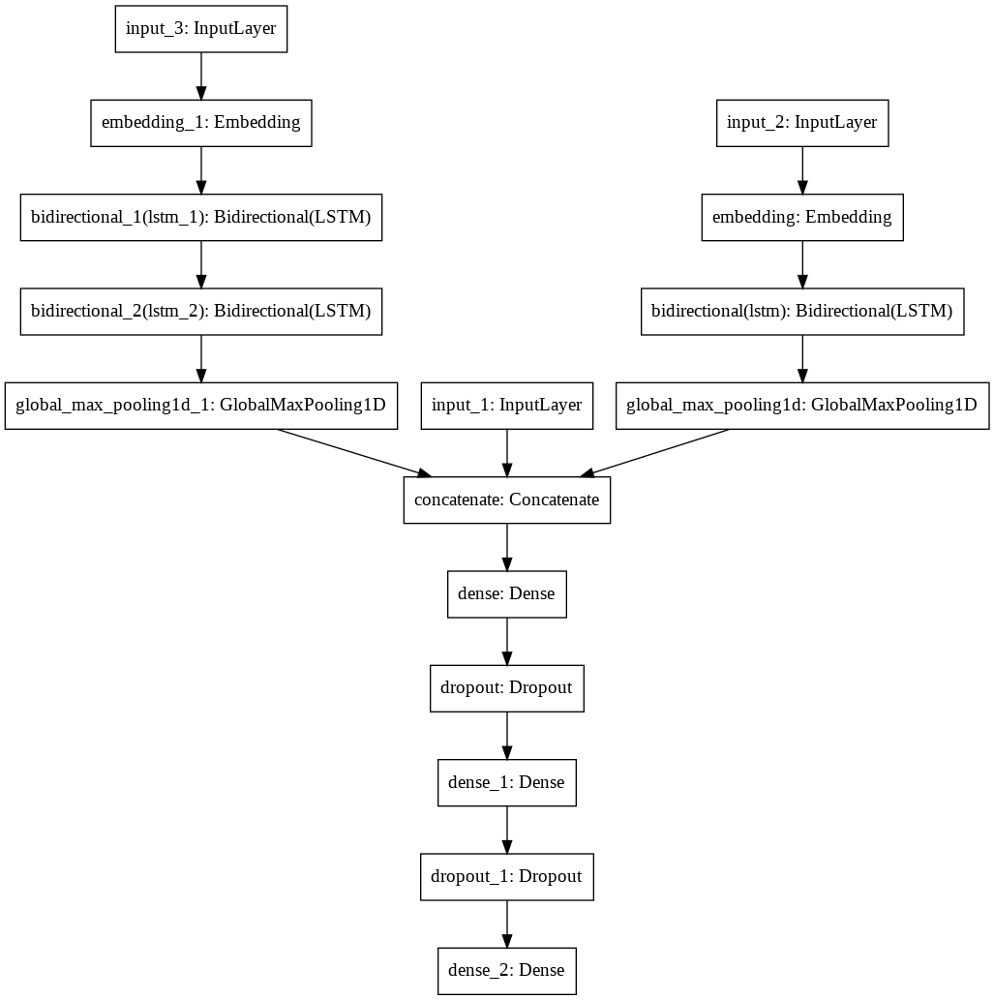

In [ ]:
plot_model(model_glove)

In [ ]:
model_glove.compile(
    loss = root_mean_squared_logarithmic_error,
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    metrics=['mse', 'mae', tf.keras.metrics.RootMeanSquaredError(), 'mean_squared_logarithmic_error', root_mean_squared_logarithmic_error])

In [ ]:
callback = [
             tf.keras.callbacks.EarlyStopping(
                  monitor='val_loss',
                  patience=3,
                  restore_best_weights=True
                  )
             ]
# Model Fit
history_glove = model_glove.fit(
    x=[inputA_train_glove,inputName_train_glove, inputDesc_train_glove],
    y=y_train_glove,
    epochs=20,
    verbose=True,
    validation_data=(
        [inputA_validation_glove ,inputName_validation_glove, inputDesc_validation_glove],
        y_validation_glove),
    callbacks=[callback],
    batch_size=256)

Epoch 1/20
3618/3618 [==============================] - 119s 33ms/step - loss: 0.5033 - mse: 968.2027 - mae: 11.8458 - root_mean_squared_error: 31.1160 - mean_squared_logarithmic_error: 0.2542 - root_mean_squared_logarithmic_error: 0.5033 - val_loss: 0.4808 - val_mse: 966.8065 - val_mae: 11.3131 - val_root_mean_squared_error: 31.0935 - val_mean_squared_logarithmic_error: 0.2321 - val_root_mean_squared_logarithmic_error: 0.4808
Epoch 2/20
3618/3618 [==============================] - 119s 33ms/step - loss: 0.5018 - mse: 960.0797 - mae: 11.8094 - root_mean_squared_error: 30.9852 - mean_squared_logarithmic_error: 0.2527 - root_mean_squared_logarithmic_error: 0.5018 - val_loss: 0.4800 - val_mse: 963.2544 - val_mae: 11.2723 - val_root_mean_squared_error: 31.0363 - val_mean_squared_logarithmic_error: 0.2313 - val_root_mean_squared_logarithmic_error: 0.4801
Epoch 3/20
3618/3618 [==============================] - 118s 33ms/step - loss: 0.5004 - mse: 957.3224 - mae: 11.7838 - root_mean_squared_e

In [ ]:
plot_history(history_glove)

Test

In [ ]:
test_glove, _ = tokenizeData(
    test ,"item_description" ,"name", tokenizer, None)

test_glove.head()

tokenize description
tokenize name


,name,item_condition_id,category_name,brand_name,price,shipping,item_description,cat1,cat2,cat3,cat1_l,cat2_l,cat3_l,brand_name_l,item_description_t,name_t
1378348,black white chuck taylor converse low,3,Kids/Boys 2T-5T/Shoes,NA,17.0,0,excellent used condition hardly worn small fla...,Kids,Boys 2T-5T,Shoes,3,65,5,1,"[97, 16, 5, 1084, 15, 25, 135, 32, 77, 485, 2,...","[11, 34, 3026, 1537, 533, 248]"
1186436,new christopher bank mother pearl ring,1,Women/Jewelry/Rings,Christopher & Banks,9.0,0,women's sz 7 mother pearl ring christopher ban...,Women,Jewelry,Rings,1,13,83,978,"[85, 168, 36, 2129, 752, 169, 9893, 2356, 1]","[1, 9893, 2356, 2129, 752, 169]"
1356069,benefit precisely brow pencil 6,1,Beauty/Makeup/Eyes,Benefit,12.0,1,new shade 6 retail rm,Beauty,Makeup,Eyes,2,7,33,65,"[1, 203, 19, 90, 9]","[792, 6505, 726, 669, 19]"
981119,jordan hydro 2 slide sandal,3,Kids/Girls 2T-5T/Shoes,NA,15.0,1,good condition scrape side one sandal size 12 ...,Kids,Girls 2T-5T,Shoes,3,49,5,1,"[33, 5, 4347, 170, 23, 305, 2, 96, 111, 84, 7,...","[290, 4881, 8, 875, 305]"
1017698,baby einstein crib fish soother,2,Kids/Toys/Baby & Toddler Toys,Baby Einstein,17.0,0,great shape fresh battery swear even helped to...,Kids,Toys,Baby & Toddler Toys,3,14,202,643,"[22, 295, 754, 352, 8244, 427, 9576, 320, 457,...","[110, 7774, 2303, 2152, 14418]"


In [ ]:
inputName_test_glove = pad_sequences(test_glove["name_t"], padding='post', maxlen=name_length_max)

In [ ]:
inputDesc_test_glove = pad_sequences(test_glove["item_description_t"],
                                                  padding='post', maxlen=desc_length_max)

In [ ]:
inputA_test_glove = test_glove[["item_condition_id", "cat1_l", "cat2_l", "cat3_l", "brand_name_l", "shipping"]].values.astype('int32')

In [ ]:
y_test_glove = test_glove["price"]
y_test_glove

1378348     17.0
1186436      9.0
1356069     12.0
981119      15.0
1017698     17.0
           ...  
1374848     20.0
1415233     10.0
376025      28.0
511335      19.0
233645     105.0
Name: price, Length: 289364, dtype: float64

In [ ]:
evaluation_glove = model_glove.evaluate(
    [inputA_test_glove, inputName_test_glove, inputDesc_test_glove],
    y_test_glove,
    return_dict=True)
evaluation_glove

9043/9043 [==============================] - 98s 11ms/step - loss: 0.4633 - mse: 804.9101 - mae: 11.0082 - root_mean_squared_error: 28.3709 - mean_squared_logarithmic_error: 0.2207 - root_mean_squared_logarithmic_error: 0.4633


{'loss': 0.4633176624774933,
 'mae': 11.008190155029297,
 'mean_squared_logarithmic_error': 0.22068239748477936,
 'mse': 804.9100952148438,
 'root_mean_squared_error': 28.37093734741211,
 'root_mean_squared_logarithmic_error': 0.46331363916397095}

# Transformers (DistilBert)

In [ ]:
train_trans_all = train
validation_trans = validation

Import of DistilBert pretrained model

In [ ]:
pret_model_trans = TFDistilBertModel.from_pretrained('distilbert-base-uncased')
pret_model_trans.trainable = False

tokenizer_trans = DistilBertTokenizerFast.from_pretrained('distilbert-base-uncased', use_fast=True)

Some layers from the model checkpoint at distilbert-base-uncased were not used when initializing TFDistilBertModel: ['activation_13', 'vocab_projector', 'vocab_transform', 'vocab_layer_norm']
- This IS expected if you are initializing TFDistilBertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFDistilBertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
All the layers of TFDistilBertModel were initialized from the model checkpoint at distilbert-base-uncased.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFDistilBertModel for predictions without further training.


In [ ]:
instances_per_batch = 200000

num_batches = int(train_trans_all.shape[0] / instances_per_batch)

trans_batch_starti = list(range(0, train_trans_all.shape[0], int(train_trans_all.shape[0] / num_batches)))[0:num_batches]
trans_batch_starti.append(train_trans_all.shape[0])

In [ ]:
trans_batches = [(trans_batch_starti[i], trans_batch_starti[i+1]) for i in range(0,len(trans_batch_starti)-1)]
[(i,b) for i,b in enumerate(trans_batches)]

[(0, (0, 231490)),
 (1, (231490, 462980)),
 (2, (462980, 694470)),
 (3, (694470, 925961))]

Splits in batch as we don't have enough memory to handle all at once and train only one batch

In [ ]:
trans_batch_number = 0

trans_batch = trans_batches[trans_batch_number]
trans_batch

(0, 231490)

In [ ]:
print("Total train shape", train_trans_all.shape)
train_trans = train_trans_all[trans_batch[0]:trans_batch[1]]
print("Train batch shape", train_trans.shape)
print("Validation shape", validation_trans.shape)

Total train shape (925961, 14)
Train batch shape (231490, 14)
Validation shape (231491, 14)


In [ ]:
y_train_trans = train_trans["price"]
y_train_trans

437703      34.0
347121      50.0
978682       9.0
504218      18.0
1356479     30.0
           ...  
912857      32.0
112803      20.0
169648      12.0
523272     116.0
1446689      5.0
Name: price, Length: 231490, dtype: float64

In [ ]:
y_validation_trans = validation_trans["price"]
y_validation_trans

26401       26.0
621860      15.0
101634      84.0
1123        12.0
778998       9.0
           ...  
1004746     31.0
696296      15.0
865104      90.0
642618     150.0
1473182     18.0
Name: price, Length: 231491, dtype: float64

Defines the model input with transforms

In [ ]:
inputA_train_trans = train_trans[["item_condition_id", "cat1_l", "cat2_l", "cat3_l", "brand_name_l", "shipping"]].values.astype('int32')

In [ ]:
inputA_validation_trans = validation_trans[["item_condition_id", "cat1_l", "cat2_l", "cat3_l", "brand_name_l", "shipping"]].values.astype('int32')

In [ ]:
trans_name_tokenizer_maxlength = 50
trans_desc_tokenizer_maxlength = 50

In [ ]:
inputName_train_trans = tokenizer_trans(train_trans["name"].to_list(),
                                  return_tensors="tf",
                                  padding='max_length',
                                  truncation=True,
                                  max_length = trans_name_tokenizer_maxlength)
inputName_train_trans['input_ids'].shape

TensorShape([231490, 50])

In [ ]:
inputName_validation_trans = tokenizer_trans(validation_trans["name"].to_list(),
                                  return_tensors="tf",
                                  padding='max_length',
                                  truncation=True,
                                  max_length = trans_name_tokenizer_maxlength)
inputName_validation_trans['input_ids'].shape

TensorShape([231491, 50])

In [ ]:
inputName_shape_trans = (inputName_train_trans['input_ids'].shape[1],
                         inputName_train_trans['attention_mask'].shape[1])

inputName_shape_trans

(50, 50)

In [ ]:
inputDesc_train_trans = tokenizer_trans(train_trans["item_description"].to_list(),
                                  return_tensors="tf",
                                  padding='max_length',
                                  truncation=True,
                                  max_length=trans_desc_tokenizer_maxlength)
inputDesc_train_trans['input_ids'].shape

TensorShape([231490, 50])

In [ ]:
inputDesc_validation_trans = tokenizer_trans(validation_trans["item_description"].to_list(),
                                  return_tensors="tf",
                                  padding='max_length',
                                  truncation=True,
                                  max_length=trans_desc_tokenizer_maxlength)
inputDesc_validation_trans['input_ids'].shape

TensorShape([231491, 50])

In [ ]:
inputDesc_shape_trans = (inputDesc_train_trans['input_ids'].shape[1],
                         inputDesc_train_trans['attention_mask'].shape[1])
inputDesc_shape_trans

(50, 50)

In [ ]:
def getModel_trans():
    inputA = Input(shape=(6,))
    Ad = inputA    
    
    inputName_ids = Input(shape=(inputName_shape_trans[0],), dtype='int32')
    inputName_mask = Input(shape=(inputName_shape_trans[1],), dtype='int32')

    Np = pret_model_trans(inputName_ids, attention_mask=inputName_mask)[0]

    Nd = Bidirectional(LSTM(12, return_sequences=True, dropout=0.2))(Np)
    Nd =  GlobalMaxPool1D()(Nd)

    inputDesc_ids = Input(shape=(inputDesc_shape_trans[0],), dtype='int32')
    inputDesc_mask = Input(shape=(inputDesc_shape_trans[1],), dtype='int32')

    Dp = pret_model_trans(inputDesc_ids, attention_mask=inputDesc_mask)[0]

    Dd = Bidirectional(LSTM(16, return_sequences=True, dropout=0.2))(Dp)
    Dd = Bidirectional(LSTM(8, return_sequences=True, dropout=0.2))(Dd)
   
    Dd = GlobalMaxPool1D()(Dd)

    concat = Concatenate()([Ad, Nd, Dd])

    x = Dropout(0.2)(concat)    
    x = Dense(32, activation='relu')(x)
    x = Dropout(0.2)(x)
    x = Dense(16, activation='relu')(x)
    
    x = Dense(1, activation='linear')(x)
    
    model = Model(inputs=[
                          inputA,
                          inputName_ids,
                          inputName_mask,
                          inputDesc_ids,
                          inputDesc_mask
                          ], outputs=x)
    
    return model
    

Model definition

In [ ]:
model_trans = getModel_trans()

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: <cyfunction Socket.send at 0x7f1710ce9d90> is not a module, class, method, function, traceback, frame, or code object
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: <cyfunction Socket.send at 0x7f1710ce9d90> is not a module, class, method, function, traceback, frame, or code object
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


The parameters `output_attentions`, `output_hidden_states` and `use_cache` cannot be updated when calling a model.They have to be set to True/False in the config object (i.e.: `config=XConfig.from_pretrained('name', output_attentions=True)`).


Cause: while/else statement not yet supported
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


The parameter `return_dict` cannot be set in graph mode and will always be set to `True`.


Cause: while/else statement not yet supported
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


The parameters `output_attentions`, `output_hidden_states` and `use_cache` cannot be updated when calling a model.They have to be set to True/False in the config object (i.e.: `config=XConfig.from_pretrained('name', output_attentions=True)`).
The parameter `return_dict` cannot be set in graph mode and will always be set to `True`.


In [ ]:
model_trans.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 50)]         0                                            
__________________________________________________________________________________________________
input_3 (InputLayer)            [(None, 50)]         0                                            
__________________________________________________________________________________________________
input_4 (InputLayer)            [(None, 50)]         0                                            
__________________________________________________________________________________________________
input_5 (InputLayer)            [(None, 50)]         0                                            
______________________________________________________________________________________________

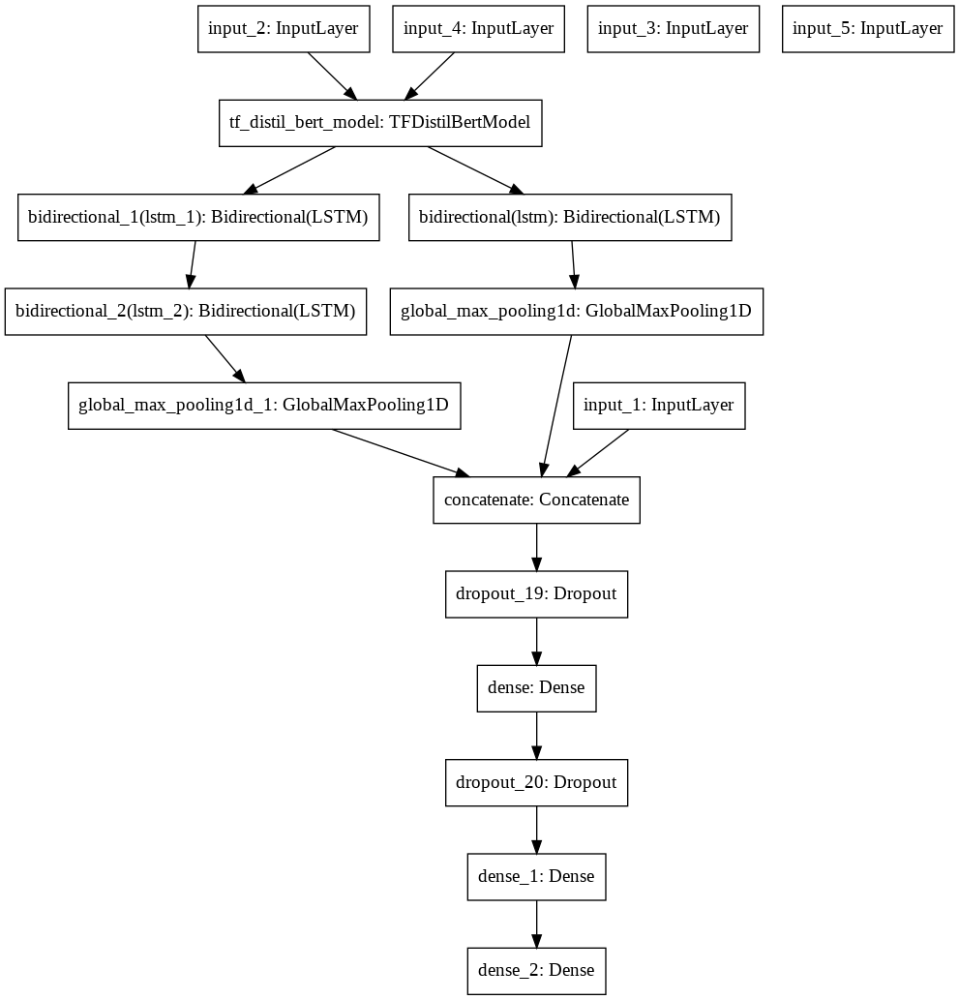

In [ ]:
plot_model(model_trans)

In [ ]:
model_trans.compile(
    loss = root_mean_squared_logarithmic_error,
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    metrics=['mse', 'mae', tf.keras.metrics.RootMeanSquaredError(), 'mean_squared_logarithmic_error', root_mean_squared_logarithmic_error])

In [ ]:
history_trans = model_trans.fit(x=[inputA_train_trans,
                   inputName_train_trans['input_ids'],
                   inputName_train_trans['attention_mask'],
                   inputDesc_train_trans['input_ids'],
                   inputDesc_train_trans['attention_mask']
                  ],
                   y=y_train_trans,
                    epochs=5,
                    verbose=True,
                    validation_data=([
                                      inputA_validation_trans,
                                      inputName_validation_trans['input_ids'],
                                      inputName_validation_trans['attention_mask'],
                                      inputDesc_validation_trans['input_ids'],
                                      inputDesc_validation_trans['attention_mask'],
                                      ], 
                                     y_validation_trans),
                    batch_size=256)

In [ ]:
model_trans

In [ ]:
pd.DataFrame(history_trans.history).plot(y=["loss", "val_loss"])

Test

In [ ]:
test_trans = test

In [ ]:
y_test_trans = test_trans["price"]
y_test_trans

1378348     17.0
1186436      9.0
1356069     12.0
981119      15.0
1017698     17.0
           ...  
1374848     20.0
1415233     10.0
376025      28.0
511335      19.0
233645     105.0
Name: price, Length: 289364, dtype: float64

In [ ]:
inputA_test_trans = test_trans[["item_condition_id", "cat1_l", "cat2_l", "cat3_l", "brand_name_l", "shipping"]].values.astype('int32')

In [ ]:
inputName_test_trans = tokenizer_trans(test_trans["name"].to_list(),
                                  return_tensors="tf",
                                  padding='max_length',
                                  truncation=True,
                                  max_length = trans_name_tokenizer_maxlength)
inputName_test_trans['input_ids'].shape

TensorShape([289364, 50])

In [ ]:
inputDesc_test_trans = tokenizer_trans(test_trans["item_description"].to_list(),
                                  return_tensors="tf",
                                  padding='max_length',
                                  truncation=True,
                                  max_length=trans_desc_tokenizer_maxlength)
inputDesc_test_trans['input_ids'].shape

In [ ]:
evaluation_trans = model_trans.evaluate(
    [
     inputA_test_trans,
     inputName_test_trans['input_ids'],
     inputName_test_trans['attention_mask'],
     inputDesc_test_trans['input_ids'],
     inputDesc_test_trans['attention_mask']
     ],
    y_test_trans,
    return_dict=True)
evaluation_trans

9043/9043 [==============================] - 95s 11ms/step - loss: 0.4560 - mse: 802.1148 - mae: 10.7208 - root_mean_squared_error: 28.3216 - mean_squared_logarithmic_error: 0.2142 - root_mean_squared_logarithmic_error: 0.4560


{'loss': 0.45600706338882446,
 'mae': 10.720763206481934,
 'mean_squared_logarithmic_error': 0.21419204771518707,
 'mse': 802.1148071289062,
 'root_mean_squared_error': 28.321632385253906,
 'root_mean_squared_logarithmic_error': 0.45600399374961853}

# Test

Requires the execution of the Data Pre-processing section

In [13]:
dtypes={
    'name': 'string',
    'item_condition_id': 'int32',
    'category_name': 'string',
    'brand_name': 'string',
    'price': 'float',
    'shipping': 'int32',
    'item_description': 'string'
}
test = pd.read_csv("test.tsv", sep='\t', dtype=dtypes)
test = test.drop(columns=["test_id"])
print(test.dtypes)
print(test.shape)
test

name                 string
item_condition_id     int32
category_name        string
brand_name           string
shipping              int32
item_description     string
dtype: object
(693359, 6)


,name,item_condition_id,category_name,brand_name,shipping,item_description
0,"Breast cancer ""I fight like a girl"" ring",1,Women/Jewelry/Rings,<NA>,1,Size 7
1,"25 pcs NEW 7.5""x12"" Kraft Bubble Mailers",1,Other/Office supplies/Shipping Supplies,<NA>,1,"25 pcs NEW 7.5""x12"" Kraft Bubble Mailers Lined..."
2,Coach bag,1,Vintage & Collectibles/Bags and Purses/Handbag,Coach,1,Brand new coach bag. Bought for [rm] at a Coac...
3,Floral Kimono,2,Women/Sweaters/Cardigan,<NA>,0,-floral kimono -never worn -lightweight and pe...
4,Life after Death,3,Other/Books/Religion & Spirituality,<NA>,1,Rediscovering life after the loss of a loved o...
...,...,...,...,...,...,...
693354,Quartz crystal on Flint stone,1,Home/Home Décor/Home Décor Accents,<NA>,0,Flint/Quartz cluster. Self mined ✨measures 3x2...
693355,It Cosmetics - Travel Bundle,1,Beauty/Makeup/Makeup Sets,IT Cosmetics,1,It Cosmetics travel bundle. Includes: Brow pow...
693356,Galaxy S8 hard shell case,1,"Electronics/Cell Phones & Accessories/Cases, C...",<NA>,1,New. Free shipping Basstop case
693357,Hi low floral kimono,2,Women/Swimwear/Cover-Ups,<NA>,0,Floral kimono. Tropical print. Open front. Hi ...


In [14]:
for column in test.columns:
    print("number of null value in {} : {}".format(column,test[column].isnull().sum()))

number of null value in name : 0
number of null value in item_condition_id : 0
number of null value in category_name : 3058
number of null value in brand_name : 295525
number of null value in shipping : 0
number of null value in item_description : 0


In [15]:
test["brand_name"] = test["brand_name"].fillna(value="NA")
test["category_name"] = test["category_name"].fillna(value="NA")
test.shape

(693359, 6)

In [16]:
test["item_description"]=test["item_description"].str.lower()
test["name"]=test["name"].str.lower()
test.head()

,name,item_condition_id,category_name,brand_name,shipping,item_description
0,"breast cancer ""i fight like a girl"" ring",1,Women/Jewelry/Rings,NA,1,size 7
1,"25 pcs new 7.5""x12"" kraft bubble mailers",1,Other/Office supplies/Shipping Supplies,NA,1,"25 pcs new 7.5""x12"" kraft bubble mailers lined..."
2,coach bag,1,Vintage & Collectibles/Bags and Purses/Handbag,Coach,1,brand new coach bag. bought for [rm] at a coac...
3,floral kimono,2,Women/Sweaters/Cardigan,NA,0,-floral kimono -never worn -lightweight and pe...
4,life after death,3,Other/Books/Religion & Spirituality,NA,1,rediscovering life after the loss of a loved o...


In [ ]:
# run if you want clean texts
test = preprocessData(test)
test.head()

In [19]:
test['cat1'], test['cat2'], test['cat3'] = zip(*test['category_name'].progress_apply(lambda x: split_cat(x)))
test.head()

,name,item_condition_id,category_name,brand_name,shipping,item_description,cat1,cat2,cat3
0,"breast cancer ""i fight like a girl"" ring",1,Women/Jewelry/Rings,NA,1,size 7,Women,Jewelry,Rings
1,"25 pcs new 7.5""x12"" kraft bubble mailers",1,Other/Office supplies/Shipping Supplies,NA,1,"25 pcs new 7.5""x12"" kraft bubble mailers lined...",Other,Office supplies,Shipping Supplies
2,coach bag,1,Vintage & Collectibles/Bags and Purses/Handbag,Coach,1,brand new coach bag. bought for [rm] at a coac...,Vintage & Collectibles,Bags and Purses,Handbag
3,floral kimono,2,Women/Sweaters/Cardigan,NA,0,-floral kimono -never worn -lightweight and pe...,Women,Sweaters,Cardigan
4,life after death,3,Other/Books/Religion & Spirituality,NA,1,rediscovering life after the loss of a loved o...,Other,Books,Religion & Spirituality


In [36]:
test["cat1_l"] = cat_le.transform(test["cat1"])
test["cat2_l"] = cat_le.transform(test["cat2"])
test["cat3_l"] = cat_le.transform(test["cat3"])

test["brand_name_l"] = brand_le.transform(test["brand_name"])

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

In [ ]:
test_keras, _ = tokenizeData(test ,"item_description", "name", tokenizer)

In [ ]:
test_keras=test[["item_condition_id","shipping","cat1_l", "cat2_l", "cat3_l","brand_name_l", "item_description_t", "name_t"]]
test_keras

In [ ]:
inputA_test_keras = test_keras[["item_condition_id", "cat1_l", "cat2_l", "cat3_l", "brand_name_l", "shipping"]].values.astype('int32')
inputName_test_keras = pad_sequences(test_keras["name_t"], padding='post', maxlen=name_length_max)
inputDesc_test_keras = pad_sequences(test_keras["item_description_t"], padding='post', maxlen=desc_length_max)
pred_keras = model_keras.predict([inputA_test_keras, inputName_test_keras, inputDesc_test_keras])
pred_keras